In [1]:
%cd ..

/Users/nash/MDS-Block-3/522/DSCI_522_group27


In [2]:
from src.download_data import download_data
import pandas as pd
import pandas_profiling 
import altair as alt
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [3]:
download_data('data','winequality-white.csv')
white_wine_df = pd.read_csv("data/winequality-white.csv")

# Exploratory data analysis of the Wine Quality Data Set (White wine)

## Research question

For this project, we are interested in creating a model to predict subjective wine quality scores, as scored by wine reviewers, based on a set of physicochemical features of the wine.

## Summary of the dataset

The data set used in this project is the wine quality data set created by Dr. P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis. It was sourced from the UCI Machine Learning Repository, which can be found here [here](https://archive.ics.uci.edu/ml/datasets/wine+quality). We will be working with the white wine data set for our analysis. 

Each row in the data set represents physicochemical properties of the wine (such as fixed acidity, residual sugar, density, pH, etc), as well as a quality rating (based on sensory data) given to the wine.

There are 4898 observations in the data set, and 11 features. There are 0 observations with missing values as can be seen in the cell below. 

## Partitioning the data into training and test sets

First, we partition the data set such that 75% of the data is in the train set and 25% of the data is in the test set.

Below is a visualization of the number of observations for quality in each of the train and test splits.

In [15]:
train_df, test_df = train_test_split(white_wine_df, test_size=0.25, random_state=123)

X_train = train_df.drop(columns=['quality'])
y_train = train_df['quality']

X_test = test_df.drop(columns=['quality'])
y_test = test_df['quality']

In [16]:
y_train_chart = alt.Chart(pd.DataFrame(y_train), title='Train data').mark_bar(size=55).encode(
    x=alt.X('quality', axis=alt.Axis(values=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])),
    y='count()'
)

y_test_chart = alt.Chart(pd.DataFrame(y_test), title='Test data').mark_bar(size=55).encode(
    x=alt.X('quality', axis=alt.Axis(values=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])),
    y='count()'
)

y_train_chart | y_test_chart

alt.HConcatChart(...)

As we would have hoped, the distribution of our data remained unchanged after the split. The weight of our distribution, however, lies around 6. Thus, it seems there is data imbalance in our quality variable. If during initial training, we notice that this is affecting our results, we may need to look into methods to address the low number of observations at the ends of the quality rating scale.

In [17]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3673 entries, 4281 to 3582
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            3673 non-null   int64  
 1   fixed acidity         3673 non-null   float64
 2   volatile acidity      3673 non-null   float64
 3   citric acid           3673 non-null   float64
 4   residual sugar        3673 non-null   float64
 5   chlorides             3673 non-null   float64
 6   free sulfur dioxide   3673 non-null   float64
 7   total sulfur dioxide  3673 non-null   float64
 8   density               3673 non-null   float64
 9   pH                    3673 non-null   float64
 10  sulphates             3673 non-null   float64
 11  alcohol               3673 non-null   float64
 12  quality               3673 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 401.7 KB


In [18]:
train_df.head()

,Unnamed: 0,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4281,4281,5.7,0.26,0.24,17.8,0.059,23.0,124.0,0.99773,3.30,0.50,10.1,5
2694,2694,6.2,0.28,0.27,10.3,0.030,26.0,108.0,0.99388,3.20,0.36,10.7,6
269,269,5.4,0.59,0.07,7.0,0.045,36.0,147.0,0.99440,3.34,0.57,9.7,6
3255,3255,7.4,0.19,0.31,14.5,0.045,39.0,193.0,0.99860,3.10,0.50,9.2,6
3150,3150,5.8,0.39,0.47,7.5,0.027,12.0,88.0,0.99070,3.38,0.45,14.0,6


In [19]:
train_df.tail()

,Unnamed: 0,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1593,1593,8.6,0.16,0.49,7.3,0.043,9.0,63.0,0.99530,3.13,0.59,10.5,6
4060,4060,6.4,0.41,0.01,6.1,0.048,20.0,70.0,0.99362,3.19,0.42,10.0,5
1346,1346,7.0,0.46,0.39,6.2,0.039,46.0,163.0,0.99280,3.21,0.35,12.2,7
3454,3454,5.8,0.54,0.00,1.4,0.033,40.0,107.0,0.98918,3.26,0.35,12.4,5
3582,3582,6.3,0.32,0.32,1.5,0.037,12.0,76.0,0.98993,3.30,0.46,12.3,6


## Check correlation between features

In [25]:
cor_data = (train_df.corr().stack()
              .reset_index()
              .rename(columns={0: 'correlation', 'level_0': 'variable', 'level_1': 'variable2'}))
cor_data['correlation_label'] = cor_data['correlation'].map('{:.2f}'.format)  # Round to 2 decimal

In [26]:
base = alt.Chart(cor_data).encode(
    x='variable2:O',
    y='variable:O'    
)

# Text layer with correlation labels
# Colors are for easier readability
text = base.mark_text().encode(
    text='correlation_label',
    color=alt.condition(
        alt.datum.correlation > 0.5, 
        alt.value('white'),
        alt.value('black')
    )
)

# The correlation heatmap itself
cor_plot = base.mark_rect().encode(
    alt.Color('correlation:Q', scale=alt.Scale(domain=(-1, 1), scheme='purpleorange'))
)

(cor_plot + text).properties(height=600, width = 600).configure_axis(labelFontSize = 16
).configure_legend(titleFontSize = 15)

alt.LayerChart(...)

From this correlation table, we can observe that there is strong positive correlation between density and residual sugar at about 0.84, and strong negative correlation between density and alcohol at about -0.78.

This chart shows that the feature which is correlated most strongly with wine quality ratings is "alcohol". Other features including "density", "chlorides" and "volatile acidity" were also found to have a weak negative correlation with quality ratings.

## Distribution of features

In [27]:
numeric_cols = list(train_df.select_dtypes(include=['float64','int64']).drop(columns=['quality']).columns)

alt.Chart(train_df).mark_bar().encode(
    alt.X(alt.repeat("repeat"), type='quantitative', bin=alt.Bin(maxbins=100)),
    alt.Y('count()')
).properties(height=100
).repeat(repeat = numeric_cols, columns=2)

alt.RepeatChart(...)

The above bar charts demonstrate the distributions of each of the features in the dataset. We can see all of our data is continuous and that each feature follows a typical distribution with few outlier’s present. This data lines up with outside sources, with the pH for example falling within [the expected range for most wine of 2.5-4.5](https://winefolly.com/deep-dive/understanding-acidity-in-wine/). These charts show that some features are relatively uniform for most wines (i.e. chlorides, density, relative sugar) while other features have a greater level of variance between different wines (i.e. alcohol, sulphates, total sulfur dioxide).

## Overlap of features

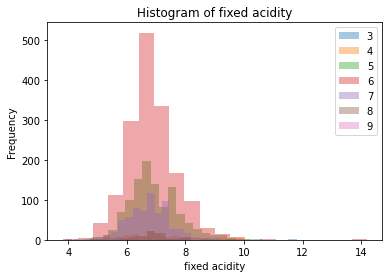

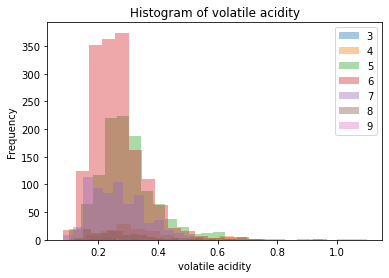

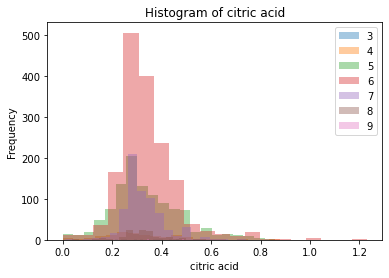

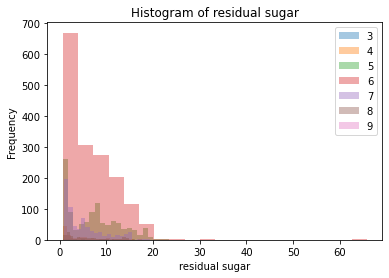

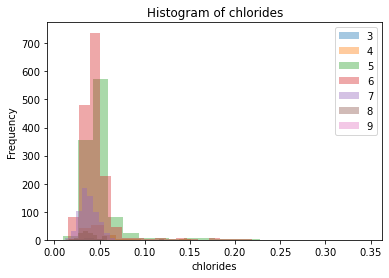

...

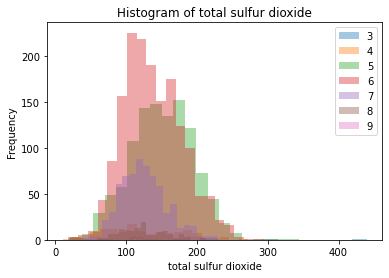

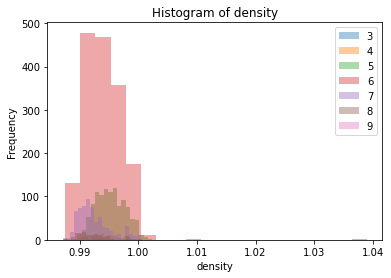

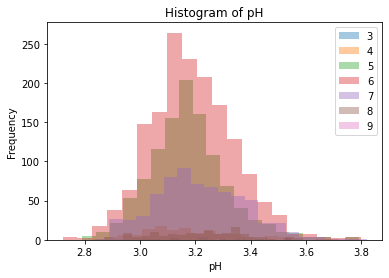

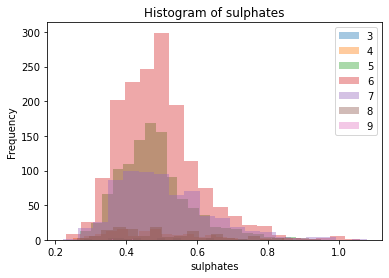

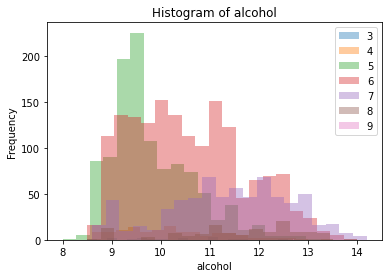

In [28]:
features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides',
         'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']

for feat in features:
    ax = train_df.groupby("quality")[feat].plot.hist(bins=20, alpha=0.4, legend=True)
    plt.xlabel(feat)
    plt.title("Histogram of " + feat)
    plt.show()

With the above charts we are able to see that different features are more heavily correlated with certain quality ratings. For example, alcohol appears to be a promising feature since we can see that lower ratings (such as 5 and 6) appear to be further skewed to the left in the chart while higher ratings appear to be more skewed to the right. Features such as fixed acidity might not be as useful since there is a lot of overlap between the quality ratings.

## Appendix - Pandas Profiling Report

In [29]:
train_df.profile_report(progress_bar = False)

From the report above, we observe that there are no missing values. There are 12 variables, and they are all numerical variables. We have 3673 observations in total in our train portion of the white wine data set.